## Training 

The purpose of this notebook is to train the neural model used in
[*The DNA of Nuclear Models*](https://arxiv.org/abs/2508.08370),
with a focus on **how int
erpretable structure emerges in the learned representations**.

Rather than emphasizing maximal predictive performance, this notebook is designed to:
- Learn embeddings for proton number (Z) and neutron number (N)
- Track how these embeddings evolve during training
- Save periodic PCA snapshots of the embeddings for later analysis
- Use a per-nucleon loss consistent with the interpretability results in the paper

The outputs of this notebook are used to study the geometry, hierarchy, and factorization
properties of the learned representations.


In [ ]:
# Make sure to install the requirements with pip install -r requirements.txt
import os
from pathlib import Path
from matplotlib import pyplot as plt
import numpy as np
import torch
from sklearn.decomposition import PCA
from argparse import Namespace
from tqdm.notebook import tqdm

PROJECT_ROOT = Path.cwd().parent
os.chdir(PROJECT_ROOT)

from lib.model import get_model_and_optim
from lib.data import prepare_nuclear_data
from lib.utils import preds_targets_zn, PlottingContext, IO, get_rms
from copy import deepcopy
import glob


Starting with a randomly initialized model.


  0%|          | 0/50000 [00:00<?, ?it/s]

Epoch 0: 5311.35
Train RMS binding RMS: 830013.74


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

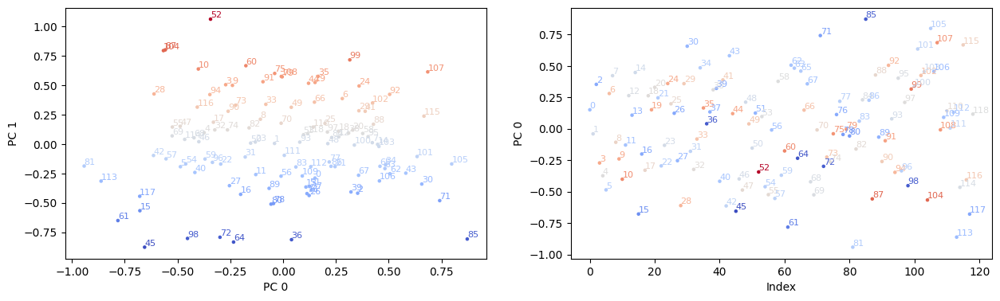

In [4]:
experiment_name = "experiments/test"
pretrained_location = "experiments/pretrain_on_semf"

# If True, only the learned Z/N embeddings are trained and the rest of the network is frozen.
train_embeddings_only = False

def set_trainable(model, train_embeddings_only: bool):
    """
    Optionally freeze the whole model except the embedding parameters.
    Assumes embeddings are stored in `model.emb` (either a Parameter/Tensor or a Module).
    """
    if not train_embeddings_only:
        return

    # Freeze everything
    for p in model.parameters():
        p.requires_grad = False

    # Unfreeze embeddings
    if hasattr(model.emb, "requires_grad"):
        model.emb.requires_grad = True
    elif hasattr(model.emb, "parameters"):
        for p in model.emb.parameters():
            p.requires_grad = True


def evaluate_and_print_rms(model, task, data, description: str):
    """
    Compute and print RMS error in "per nucleon" units, consistent with get_rms(..., scale_by_A=True).
    """
    preds, targets, zn = preds_targets_zn(data, model, task, train=True)

    # Convert to per-nucleon values (A = Z + N)
    A = zn.sum(1).reshape(-1, 1)
    preds_pn = preds / A
    targets_pn = targets / A.sum(-1)  # match expected shape in get_rms

    rms = get_rms(preds_pn, targets_pn, zn, scale_by_A=True)
    print(f"{description} RMS: {rms:.2f}")


def train_model(task, expand_zn, mult_factors, pretrained_location, use_pretrained, run_name):
    """
    Train the baseline model on a given task (e.g. binding energy),
    optionally initializing from a pretrained checkpoint, and saving PCA snapshots of embeddings.
    """

    # ---- Training configuration (edit as needed) ----
    args = {
        "DEPTH": 2,
        "DEV": "cpu",
        "EPOCHS": 50_000,
        "HIDDEN_DIM": 1024,
        "LR": 3e-4,
        "MODEL": "baseline",
        "SIGMOID_READOUT": "false",
        "TMS": "remove",
        "WD": 0.01,
        "TARGETS_CLASSIFICATION": {},
        "TARGETS_REGRESSION": {
            "binding": 100,
        },
        "EXPAND_ZN": expand_zn,
        "MULT_FACTORS": mult_factors,
        "TRAIN_FRAC": 1,
        "LIPSCHITZ": "false",
        "TRAIN_SET": "all_data",
        "BATCH_SIZE": 1024,
        "LOG_TIMES": 100,
        "NUCLEI_GE": 20,
        "NUCLEI_HIGH_UNC": "false",
        "PER_NUCLEON": "false",
        "SEED": 2,
    }

    # Load pretrained args (currently not merged into args; left here for reference/debugging)
    pretrained_args = IO.load_args(f"{pretrained_location}/args.yaml")
    pretrained_args = vars(pretrained_args)

    # Build data + model
    args = Namespace(**args)
    data = prepare_nuclear_data(args)
    model, optim_model = get_model_and_optim(data, args)

    # Optionally load pretrained weights
    if use_pretrained:
        model.load_state_dict(torch.load(f"{pretrained_location}/model.pt", map_location=args.DEV))
    else:
        print("Starting with a randomly initialized model.")

    torch.manual_seed(args.SEED)

    # ---- Prepare training tensors (drop NaNs) ----
    X_train = data.X[data.train_mask]
    y_train = data.y[data.train_mask]
    non_nan = ~torch.isnan(y_train.view(-1))
    X_train = X_train[non_nan]
    y_train = y_train[non_nan]

    # Freeze/unfreeze parameters depending on experiment
    set_trainable(model, train_embeddings_only)

    epochs = args.EPOCHS

    # Save 100 PCA snapshots across training (plus final epoch)
    save_pca_every = epochs // 100
    os.makedirs(f"{experiment_name}/{run_name}/pca_snapshots", exist_ok=True)

    for epoch in (pbar := tqdm(range(epochs))):
        optim_model.zero_grad()

        # Forward pass over all training points
        preds = model(X_train)

        # Select the column corresponding to the task index stored in X_train[:, 2]
        preds = preds.gather(1, X_train[:, 2].long().view(-1, 1))

        # ---- Loss: RMS in per-nucleon space ----
        A = X_train[:, :2].sum(1, keepdim=True)  # A = Z + N
        preds_pn = preds / A
        y_train_pn = y_train / A
        diff = preds_pn - y_train_pn
        loss = torch.sqrt(torch.mean(diff ** 2))

        loss.backward()
        optim_model.step()

        # ---- PCA snapshots of embeddings ----
        if epoch % save_pca_every == 0 or epoch == epochs - 1:
            # NOTE: assumes model.emb[0] = Z embeddings, model.emb[1] = N embeddings
            embed_z = model.emb[0].detach().cpu().numpy()
            embed_n = model.emb[1].detach().cpu().numpy()

            # Fit a *shared* PCA basis on concatenated embeddings (so Z and N are comparable)
            stacked = np.concatenate([embed_z, embed_n], axis=0)
            pca = PCA(n_components=3)
            stacked_pca = pca.fit_transform(stacked)

            embed_z_pca = stacked_pca[: len(embed_z)]
            embed_n_pca = stacked_pca[len(embed_z) :]

            # Labels correspond to integer Z and N values
            Z_labels = np.arange(len(embed_z))
            N_labels = np.arange(len(embed_n))

            # Save as dictionaries for later plotting/analysis
            np.save(
                f"{experiment_name}/{run_name}/pca_snapshots/epoch_{epoch:05d}_embed_z.npy",
                {"pca": embed_z_pca, "labels": Z_labels},
            )
            np.save(
                f"{experiment_name}/{run_name}/pca_snapshots/epoch_{epoch:05d}_embed_n.npy",
                {"pca": embed_n_pca, "labels": N_labels},
            )

        # ---- Periodic logging + quick plots ----
        if epoch % (epochs // 10) == 0:
            print(f"Epoch {epoch}: {loss.item():.2f}")
            evaluate_and_print_rms(model, task, data, f"Train RMS {task}")

            # NOTE: bug fix vs original: you had model.emb[1] for both Z and N
            embed_z = model.emb[0].detach().cpu().numpy()
            embed_n = model.emb[1].detach().cpu().numpy()

            PlottingContext.plot_embedding(embed_z, num_components=3, figscale=1)
            PlottingContext.plot_embedding(embed_n, num_components=3, figscale=1)
            plt.show()
            plt.close('all')

        pbar.set_description(f"Epoch {epoch}: {loss.item():.2e}")

    # ---- Save final checkpoint ----
    os.makedirs(f"{experiment_name}/{run_name}", exist_ok=True)
    torch.save(model.state_dict(), f"{experiment_name}/{run_name}/model.pt")
    IO.save_args(args, f"{experiment_name}/{run_name}/args.yaml")


# Example run
terms = ["volume", "surface", "coulomb", "pauli", "pairing"]
mult_factors = [1, 1, 1, 1, 1]
expand_zn = "false"

use_pretrained = False
run_name = "binding_50k"
train_model("binding", expand_zn, mult_factors, pretrained_location, use_pretrained, run_name)


## Model evaluation and embedding inspection

In this cell, we show the predictive performance of the newly trained model
using the root-mean-square (RMS) error on binding energy predictions.

We also call a reference model, which is trained on the semi-empirical mass formula 
(and thus its RMS cannot be compared directly)                                                                    

After evaluating both models, we visualize the learned embedding space of the
newly trained model to confirm that the characteristic low-dimensional structure
discussed in the paper is present.


Pre-trained model RMS: 6912.15
Newly trained model RMS: 95109.30


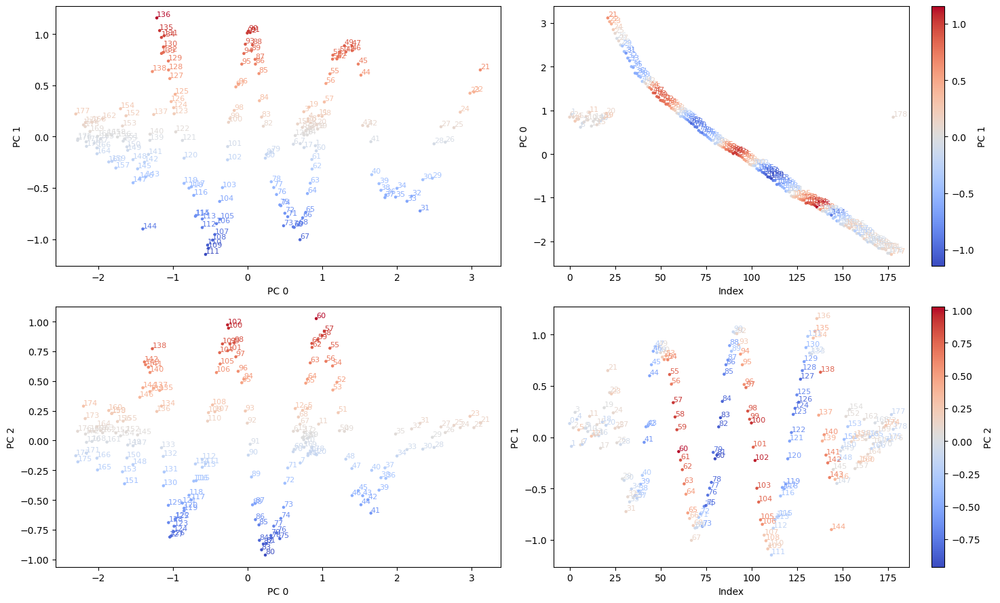

In [9]:
# Function to evaluate and print the RMS for a model
def evaluate_and_print_rms(model, task, data, description):
    preds, targets, zn = preds_targets_zn(data, model, task, train=True)
    preds_pn = preds/zn.sum(1).reshape(-1,1)
    targets_pn = targets/zn.sum(1)
    rms = get_rms(preds_pn, targets_pn, zn, scale_by_A=True)
    print(f"{description} RMS: {rms:.2f}")

    
# Load the arguments and data preparation
pre_args = IO.load_args(f"{pretrained_location}/args.yaml")
pre_data = prepare_nuclear_data(pre_args)
args = IO.load_args(f"{experiment_name}/{run_name}/args.yaml")
data = prepare_nuclear_data(args)

# Load the pre-trained model
pretrained_model_path = f"{pretrained_location}/model.pt"  # Adjust path as needed
pretrained_model, _ = get_model_and_optim(pre_data, pre_args)
pretrained_model.load_state_dict(torch.load(pretrained_model_path, map_location=args.DEV))
pretrained_model.eval()

# Load the newly trained model
new_model_path = f"{experiment_name}/{run_name}/model.pt"  # Adjust path as needed
new_model, _ = get_model_and_optim(data, args)
new_model.load_state_dict(torch.load(new_model_path, map_location=args.DEV))
new_model.eval()

# Evaluate and print RMS for both models
evaluate_and_print_rms(pretrained_model, "binding_semf", pre_data, "Pre-trained model")
evaluate_and_print_rms(new_model, "binding", data, "Newly trained model")


embed0 = new_model.emb[1].detach().cpu().numpy()
PlottingContext.plot_embedding(embed0, num_components=3, figscale=1) 
plt.show()

This cell visualizes the evolution of the learned proton (Z) and neutron (N) embeddings
throughout training. Each plot corresponds to a PCA snapshot saved at a given epoch,
with Z and N embeddings projected into a shared 3D PCA basis to allow direct comparison.

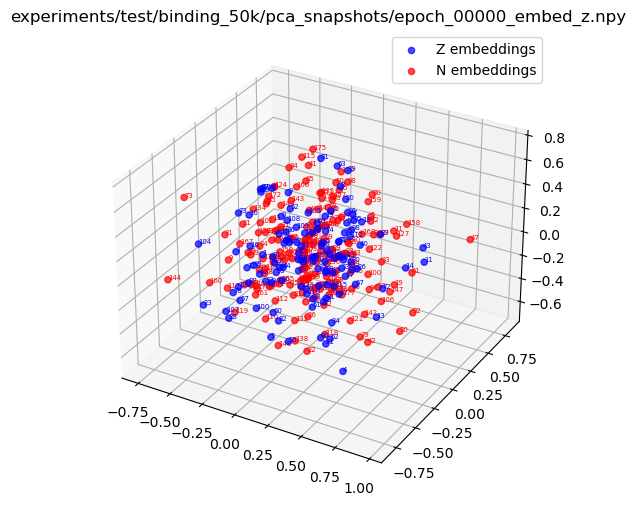

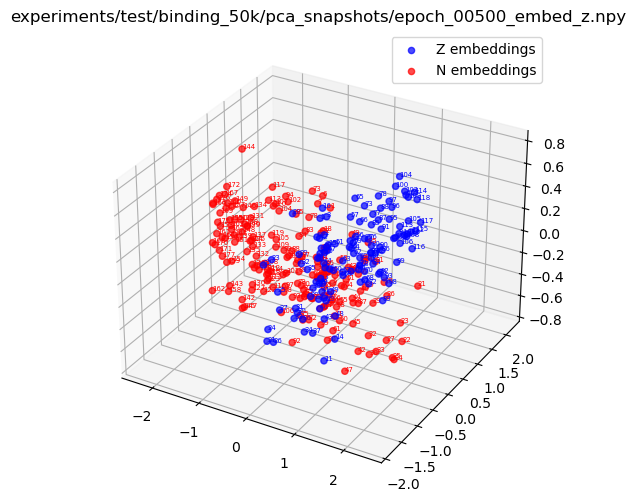

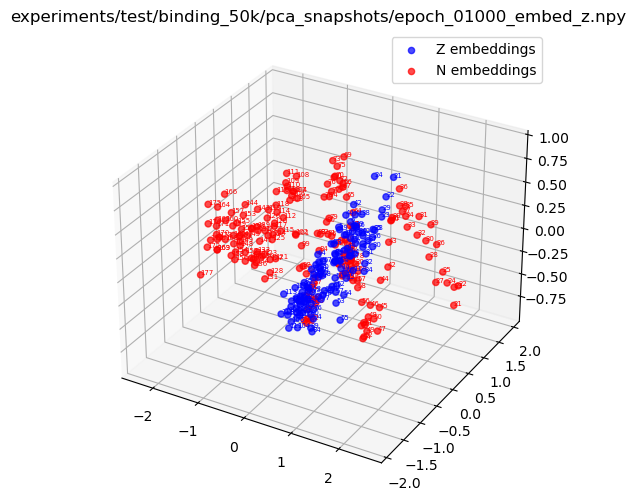

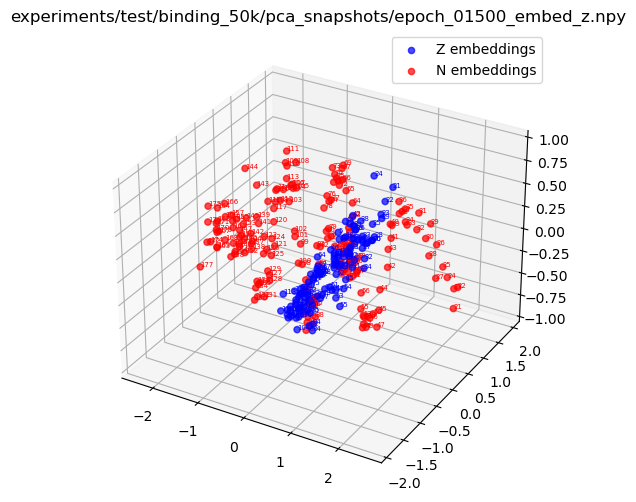

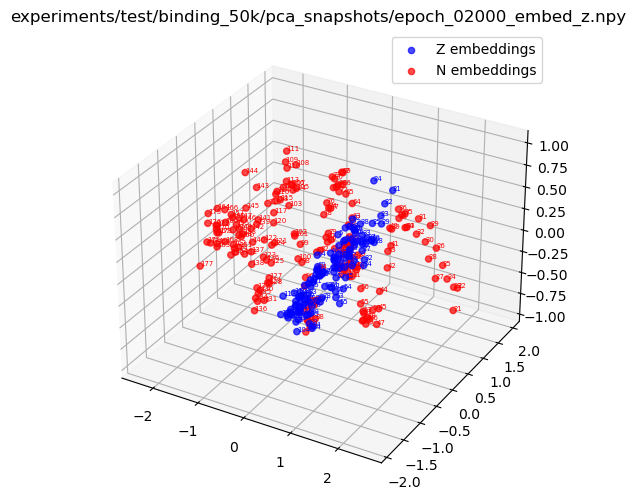

...

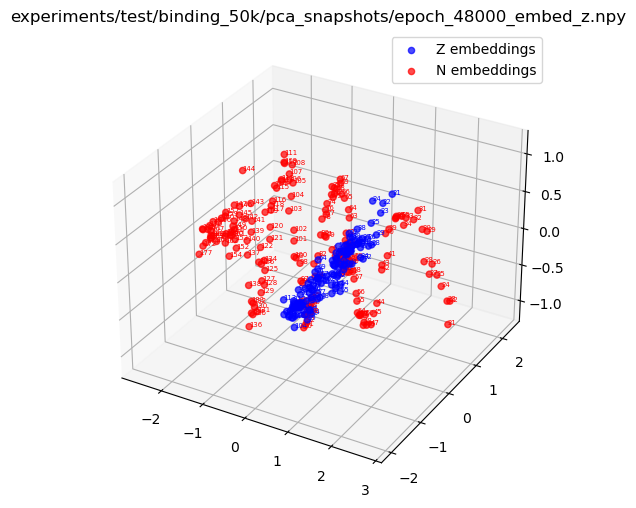

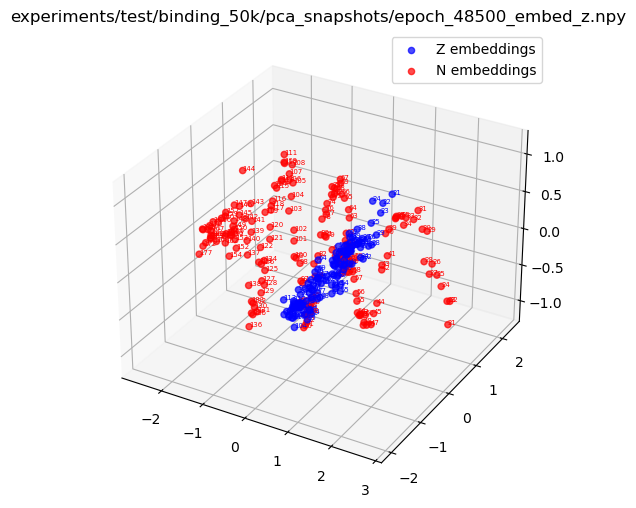

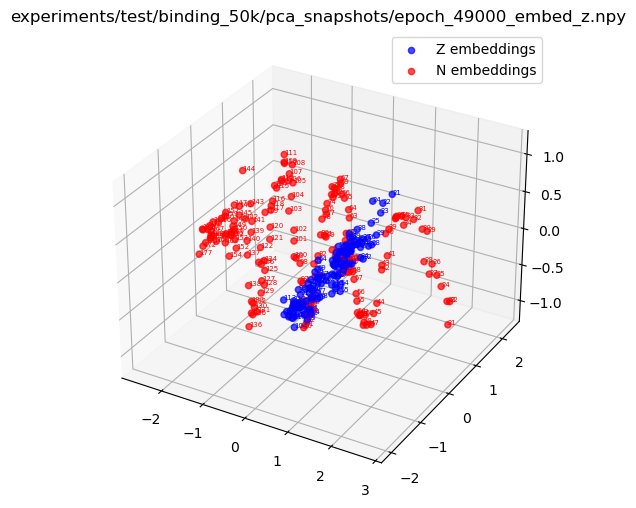

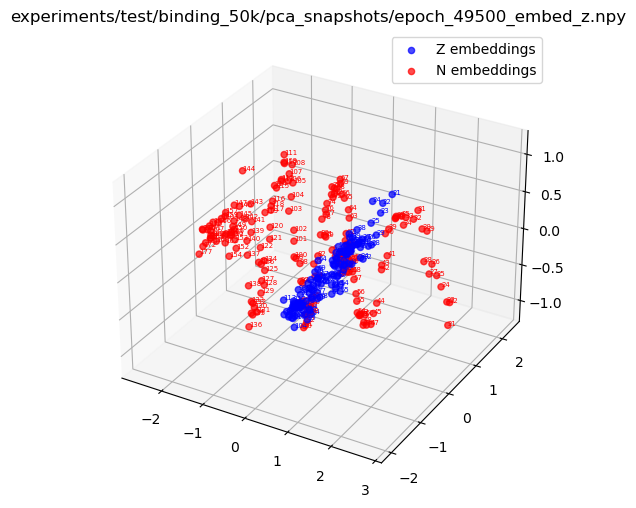

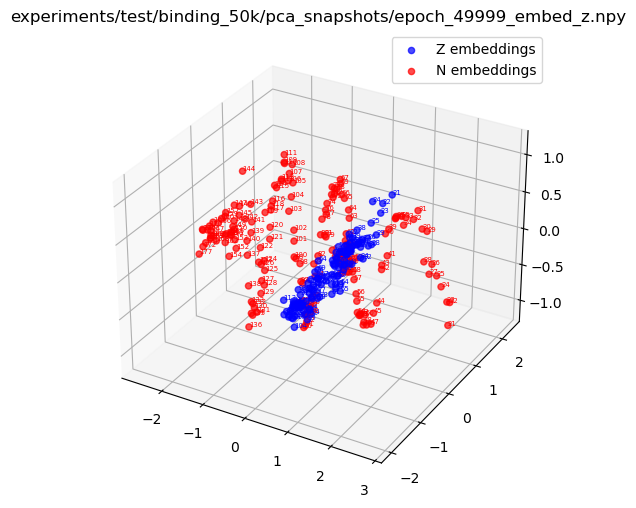

In [8]:
# Collect all saved PCA snapshots for Z and N embeddings
z_files = sorted(glob.glob(f"{experiment_name}/{run_name}/pca_snapshots/*_embed_z.npy"))
n_files = sorted(glob.glob(f"{experiment_name}/{run_name}/pca_snapshots/*_embed_n.npy"))

plot_every = 1000  # plot every 10th PCA snapshot

# Loop over snapshots (assumes Z and N files are aligned by epoch)
for zfile, nfile in zip(z_files[::plot_every], n_files[::plot_every]):
    # Load PCA data and integer labels
    z_data = np.load(zfile, allow_pickle=True).item()
    n_data = np.load(nfile, allow_pickle=True).item()
    
    z_pca = z_data["pca"]
    z_labels = z_data["labels"]

    n_pca = n_data["pca"]
    n_labels = n_data["labels"]

    # Create a 3D scatter plot of the embeddings
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection="3d")

    ax.scatter(
        z_pca[:, 0], z_pca[:, 1], z_pca[:, 2],
        label="Z embeddings", alpha=0.7, c="blue"
    )
    ax.scatter(
        n_pca[:, 0], n_pca[:, 1], n_pca[:, 2],
        label="N embeddings", alpha=0.7, c="red"
    )

    # OPTIONAL: annotate each point with its corresponding Z or N value
    # (useful for debugging or small ranges; can be noisy for large Z/N)
    for i, z in enumerate(z_labels):
        ax.text(z_pca[i, 0], z_pca[i, 1], z_pca[i, 2],
                str(z), size=5, color="blue")
    for i, n in enumerate(n_labels):
        ax.text(n_pca[i, 0], n_pca[i, 1], n_pca[i, 2],
                str(n), size=5, color="red")

    ax.legend()
    ax.set_title(zfile)  # filename encodes the training epoch
    plt.show()


## Helical fits to learned embedding trajectories

In this section, we explicitly fit a parametric 3D helix to the learned proton (Z)
and neutron (N) embedding trajectories after training.

The helix parameters (radius, pitch, frequency, axis,
and phase) are learned by minimizing the mean-squared error between the helix and
the embedding coordinates in PCA space.

In [14]:
def find_orthonormal_basis(a):
    """
    Given a vector a, construct two orthonormal vectors perpendicular to it.
    Used to define the transverse plane of the helix.
    """
    device = a.device
    if a[0] != 0 or a[1] != 0:
        v1 = torch.tensor([-a[1], a[0], 0], dtype=torch.float32, device=device)
    else:
        v1 = torch.tensor([0, -a[2], a[1]], dtype=torch.float32, device=device)

    v1 = v1 / torch.norm(v1)
    v2 = torch.cross(a, v1)
    return v1, v2


def helix(t, R, F, P, axis, start, phase1, phase2, final_linear, B):
    """
    Parametric 3D helix with optional linearly varying radius.
    """
    a = axis / torch.norm(axis)
    u, v = find_orthonormal_basis(a)

    # Allow the radius to grow or shrink linearly with t
    R_t = R + B * t[:, None]

    V_perp = R_t * (
        torch.cos(2 * torch.pi * F * t + phase1)[:, None] * u +
        torch.sin(2 * torch.pi * F * t + phase2)[:, None] * v
    )

    # Component along the helix axis
    V_axis = P * t[:, None] * a

    return (V_perp + V_axis + start) @ final_linear


def cartesian_to_spherical(coords):
    """Utility: Cartesian → spherical coordinates (r, theta, phi)."""
    x, y, z = coords
    r = np.sqrt(x**2 + y**2 + z**2)
    theta = np.arccos(z / r)
    phi = np.arctan2(y, x)
    return r, np.rad2deg(theta), np.rad2deg(phi)


def angle_between_vectors(v1, v2):
    """Return the angle (in degrees) between two vectors."""
    dot_product = np.dot(v1, v2)
    mag_v1 = np.linalg.norm(v1)
    mag_v2 = np.linalg.norm(v2)

    cos_angle = dot_product / (mag_v1 * mag_v2)
    cos_angle = np.clip(cos_angle, -1.0, 1.0)

    return np.degrees(np.arccos(cos_angle))


def get_spiral_preds(emb_pca_0, R_init, F_init, P_init, axis_init, start_init, final_linear_init):
    """
    Fit a parametric helix to PCA-projected embeddings by gradient descent.
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    emb_pca = torch.tensor(emb_pca_0, dtype=torch.float32, device=device)

    # Parameterize the embedding index by t ∈ [0, 1]
    t = torch.linspace(0, 1, len(emb_pca), device=device)

    # Learnable helix parameters
    R = torch.tensor(R_init, requires_grad=True, device=device)
    F = torch.tensor(F_init, requires_grad=True, device=device)
    P = torch.tensor(P_init, requires_grad=True, device=device)
    B = torch.tensor(0.0, requires_grad=True, device=device)  # radius variation

    axis = torch.tensor(axis_init, requires_grad=True, device=device)
    start = torch.tensor(start_init, requires_grad=True, device=device)
    phase1 = torch.tensor(0.5, requires_grad=True, device=device)
    phase2 = torch.tensor(0.0, requires_grad=False, device=device)

    final_linear = torch.tensor(final_linear_init, requires_grad=True, device=device)

    optimizer = torch.optim.Adam(
        [R, F, P, B, axis, start, phase1, phase2, final_linear],
        lr=0.01
    )

    def loss_fn(predicted, target):
        return ((predicted - target) ** 2).mean()

    epochs = 3000
    for epoch in range(epochs):
        optimizer.zero_grad()
        predicted = helix(t, R, F, P, axis, start, phase1, phase2, final_linear, B)
        target = emb_pca[:, :3]
        loss = loss_fn(predicted, target)
        loss.backward()
        optimizer.step()

        if (epoch + 1) % 100 == 0:
            print(f"Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}", end="\r")

    spiral_params = {
        k: v.detach().cpu().numpy()
        for k, v in {
            "t": t, "R": R, "F": F, "P": P, "B": B,
            "axis": axis, "start": start,
            "phase1": phase1, "phase2": phase2,
            "final_linear": final_linear
        }.items()
    }

    return predicted, spiral_params, loss


# --- Apply helix fitting to Z and N embeddings ---

model = new_model

# Restrict to central regions to avoid edge effects
start_z, end_z = 30, 80
pca_z = PCA(n_components=end_z - start_z)
emb_pca_z = pca_z.fit_transform(model.emb[0].detach().cpu().numpy())[start_z:end_z]

start_n, end_n = 30, 115
pca_n = PCA(n_components=end_n - start_n)
emb_pca_n = pca_n.fit_transform(model.emb[1].detach().cpu().numpy())[start_n:end_n]

# Initial helix parameters
R_def = 1.0
F_def = 2.0
P_def = 5.0
axis_def = [1.0, 0.0, 0.0]
start_def = [-3.0, -1.0, 0.0]
final_layer_def = np.eye(3)

predicted_n, spiral_n_params, loss_n = get_spiral_preds(
    emb_pca_n, R_def, F_def, P_def, axis_def, start_def, final_layer_def
)
predicted_z, spiral_z_params, loss_z = get_spiral_preds(
    emb_pca_z, R_def, F_def, P_def, axis_def, start_def, final_layer_def
)

# Residuals between embeddings and best-fit helices
diff_n = emb_pca_n[:, :3] - predicted_n.detach().cpu().numpy()
diff_z = emb_pca_z[:, :3] - predicted_z.detach().cpu().numpy()


## Perturbing the embedding geometry via helix parameters

Next we construct a modified copy of the trained model where the learned
Z and N embeddings are replaced (over a selected index range) by the best-fit helix
parameterization in PCA space, optionally with small controlled modifications.

We then invert the PCA transform to map the modified helix back into the original
embedding space, insert these modified embeddings into the model, and evaluate how
the binding-energy predictions change along isotopic (fixed Z) and isotonic (fixed N)
chains. The resulting agreement is not expected to be exact: the model prediction employs
the first three PCAs obtained from the helix fit, rather than the
original ones learned directly during training.

This enables a controlled “geometry → prediction” sensitivity study: we can vary helix
parameters and directly observe their impact on model outputs. 

In [18]:
@torch.no_grad()
def get_spiral_outputs(params_n, params_z):
    """
    Build a copy of the trained model whose Z/N embeddings (in a chosen index range)
    are replaced by helix-parameterized embeddings (defined in PCA space and mapped back).
    Returns per-nucleon model outputs: E_B / A.
    """

    # Ensure all helix parameters are torch tensors on the correct device
    params_n = {
        k: (v.clone().detach() if torch.is_tensor(v) else torch.tensor(v, dtype=torch.float32)).to(args.DEV)
        for k, v in params_n.items()
    }
    params_z = {
        k: (v.clone().detach() if torch.is_tensor(v) else torch.tensor(v, dtype=torch.float32)).to(args.DEV)
        for k, v in params_z.items()
    }

    # Generate helix points in PCA space and re-add residuals from the helix fit (diff_n/diff_z)
    helix_n = helix(**params_n).cpu().numpy() + diff_n
    helix_z = helix(**params_z).cpu().numpy() + diff_z

    # Copy model so we can edit embeddings without touching the original model
    model_spiral = deepcopy(model)
    model_spiral.readout = model.readout  # keep same readout head

    # --- Replace N embeddings over [start_n:end_n] ---
    spiral_embs_n = emb_pca_n.copy()
    spiral_embs_n[:, :3] = helix_n  # overwrite only first 3 PCA dims
    spiral_embs_n = pca_n.inverse_transform(spiral_embs_n)  # back to embedding space
    spiral_embs_n = torch.tensor(spiral_embs_n, device=args.DEV).float()
    model_spiral.emb[1][start_n:end_n] = spiral_embs_n

    # --- Replace Z embeddings over [start_z:end_z] ---
    spiral_embs_z = emb_pca_z.copy()
    spiral_embs_z[:, :3] = helix_z
    spiral_embs_z = pca_z.inverse_transform(spiral_embs_z)
    spiral_embs_z = torch.tensor(spiral_embs_z, device=args.DEV).float()
    model_spiral.emb[0][start_z:end_z] = spiral_embs_z

    # Evaluate model outputs and convert to per-nucleon quantity
    output_spiral = model_spiral(X) / X.sum(1, keepdim=True)

    return output_spiral


def plot_output_with_params(
    params_n,
    params_z,
    output_default,
    X,
    savepath=None,
    fix_Z=50,
    fix_N=60,
    mod="R",
    val=1,
    plot_full_spiral=False,
):
    """
    Plot model predictions along:
      - an isotopic chain (fixed Z, varying N)
      - an isotonic chain (fixed N, varying Z)

    Compares baseline outputs (output_default) with outputs from the helix-modified embeddings.
    """

    with torch.no_grad():
        # Ensure X is on CPU for numpy indexing
        X = X.cpu().numpy() if isinstance(X, torch.Tensor) else X

        # Detach params (used for plotting / helix generation)
        params_n = {k: (v.clone().detach() if torch.is_tensor(v) else torch.tensor(v, dtype=torch.float32)) for k, v in params_n.items()}
        params_z = {k: (v.clone().detach() if torch.is_tensor(v) else torch.tensor(v, dtype=torch.float32)) for k, v in params_z.items()}

        # Helix coordinates in PCA space (first 3 dims) — useful for debugging/visualization
        helix_n = helix(**params_n)[:, :3].detach().cpu().numpy()
        helix_z = helix(**params_z)[:, :3].detach().cpu().numpy()

        # Compute outputs from the helix-modified model
        output_spiral = get_spiral_outputs(params_n, params_z)

        # Select indices for the requested isotopic / isotonic chains
        sel_n = np.where(X[:, 0] == fix_Z)[0]  # fixed Z, vary N
        sel_z = np.where(X[:, 1] == fix_N)[0]  # fixed N, vary Z

        fig = plt.figure(figsize=(12, 8))

        # --- Isotopic chain: Z fixed ---
        ax3 = fig.add_subplot(223)
        X_sel_n = X[sel_n, 1]
        ax3.plot(X_sel_n, output_default[sel_n], "-o",
                 label=r"Simplified SEMF ($2\times a_S$)", color="black")
        ax3.plot(X_sel_n, output_spiral[sel_n].detach().cpu().numpy(), "-o",
                 label="Spiral N (modified)", color="purple")
        ax3.set_xlabel("N")
        ax3.set_ylabel(r"$E_B / A$")
        ax3.set_title(f"Isotopic chain for Z={fix_Z}")
        ax3.legend()

        # --- Isotonic chain: N fixed ---
        ax4 = fig.add_subplot(224)
        X_sel_z = X[sel_z, 0]
        ax4.plot(X_sel_z, output_default[sel_z], "-o",
                 label=r"Simplified SEMF ($2\times a_S$)", color="black")
        ax4.plot(X_sel_z, output_spiral[sel_z].detach().cpu().numpy(), "-o",
                 label="Spiral Z (modified)", color="orange")
        ax4.set_xlabel("Z")
        ax4.set_ylabel(r"$E_B / A$")
        ax4.set_title(f"Isotonic chain for N={fix_N}")
        ax4.legend()

        if savepath:
            plt.savefig(savepath)
        plt.show()


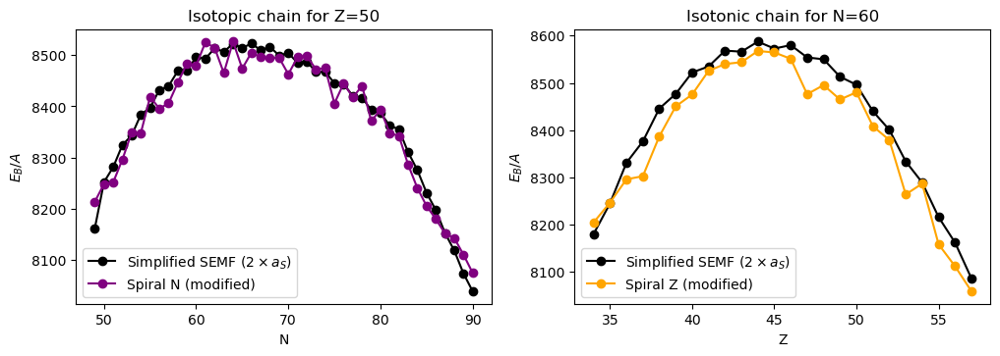

In [19]:
# Select only nuclei in the chosen (Z, N) window and only for task index 0
sel = (
    (data.X[:, 0] >= start_z) & (data.X[:, 0] < end_z) &
    (data.X[:, 1] >= start_n) & (data.X[:, 1] < end_n) &
    (data.X[:, 2] == 0)  # task index (e.g. binding)
)
X = data.X[sel]

# Get predictions/targets and convert to per-nucleon values (E_B / A)
preds, targets, zn = preds_targets_zn(data, model, "binding", train=True)
A = zn.sum(1)

preds_pn = preds / A.reshape(-1, 1)
targets_pn = targets / A

# Restrict to the same selection window (sel is a torch mask over data.X)
sel_np = sel.detach().cpu().numpy()
preds_pn = preds_pn[sel_np]
targets_pn = targets_pn[sel_np]

with torch.no_grad():
    # Start from the fitted helix parameters and optionally perturb them
    new_params = {
        "params_n": deepcopy(spiral_n_params),
        "params_z": deepcopy(spiral_z_params),
    }

    # Example: modify helix pitch P (currently no-op since *= 1)
    new_params["params_n"]["P"] *= 1
    new_params["params_z"]["P"] *= 1

    # Compare baseline vs helix-modified predictions along isotopic/isotonic chains
    plot_output_with_params(
        **new_params,
        X=X,
        savepath=None,
        output_default=targets_pn,  # baseline reference curve
        mod="R",
        val=1,
        plot_full_spiral=True,
    )
